In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from scipy.stats import norm
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from PIL import Image
import sys
import subprocess
import os
import time

In [2]:
def select_gpu_with_low_usage():
    device_ids = list(range(torch.cuda.device_count()))
    min_memory_free = 20000
    min_gpu_id = -1

    result = subprocess.run(['nvidia-smi', '--query-gpu=memory.free', '--format=csv,nounits,noheader'], stdout=subprocess.PIPE)
    gpu_memory = [int(x) for x in result.stdout.decode('utf-8').strip().split('\n')]

    for gpu_id in device_ids:
        torch.cuda.set_device(gpu_id)
        memory_usage = torch.cuda.memory_reserved() - torch.cuda.memory_allocated()
        gpu_utilization = torch.cuda.utilization(gpu_id)
        if gpu_memory[gpu_id] > min_memory_free and gpu_utilization < 10:
            min_memory_usage = memory_usage
            min_gpu_id = gpu_id

    return min_gpu_id

selected_gpu_id = select_gpu_with_low_usage()
device="cuda:"+str(selected_gpu_id)

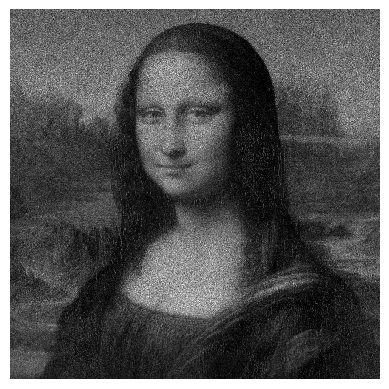

In [3]:
transform = transforms.Compose([
    transforms.ToTensor(),
])


# Open the image using PIL (Python Imaging Library)
image = Image.open('mona.png')


# Apply the transformation to convert the image to a PyTorch tensor
image_tensor = transform(image)[0][:500, :500] # type: ignore

samples_per_column = 10000
image_dist = torch.distributions.Categorical(image_tensor/image_tensor.sum(dim=1, keepdim=True))
dist_sample = image_dist.sample((samples_per_column,)).T # type: ignore

def samples_to_coords(samples, norm=False):
    ax1c = samples.shape[0]-1-torch.arange(samples.shape[0]).unsqueeze(1).expand(-1, samples.shape[1])
    if norm:
        ax1c = ax1c*2/dist_sample.shape[0]-1
    return torch.stack([
        samples,
        ax1c.to(samples.device),
    ]).reshape(2, -1)

coord_samples = samples_to_coords(dist_sample)
weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, dist_sample.shape[1]).reshape(-1)

os.makedirs('plots', exist_ok=True)

plt.hist2d(*samples_to_coords(dist_sample).float().numpy(), weights=weights, bins=image_tensor.shape, cmap='gray', rasterized=True);
plt.gca().set_aspect(1)
plt.axis("off")
plt.savefig('plots/original.pdf', bbox_inches='tight')
plt.show()
plt.close()

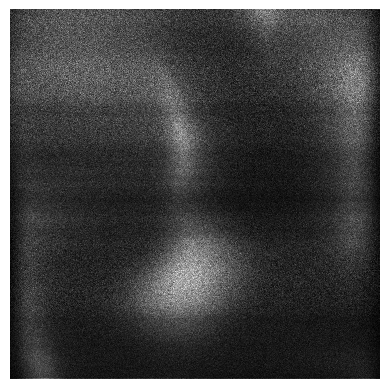

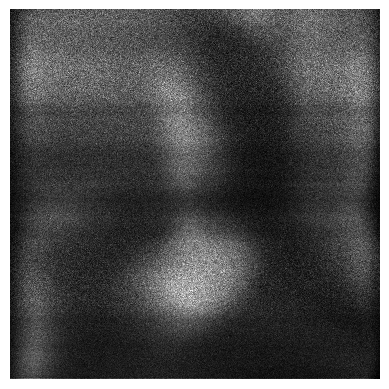

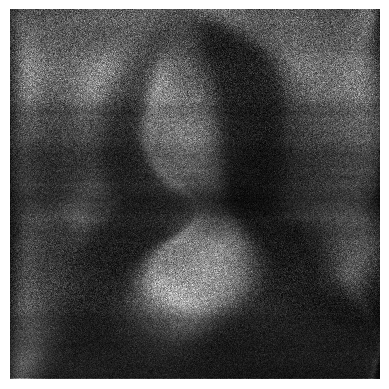

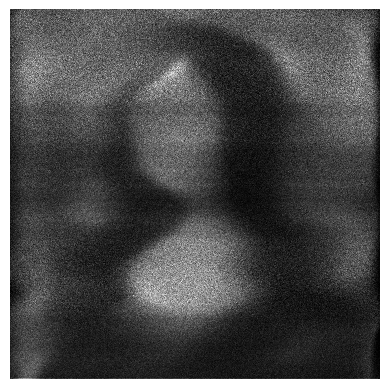

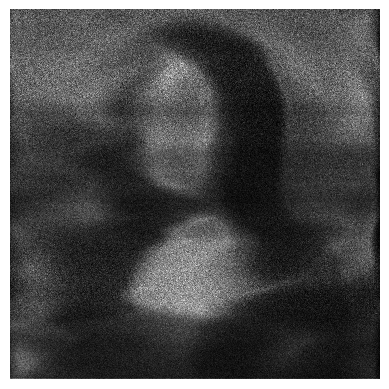

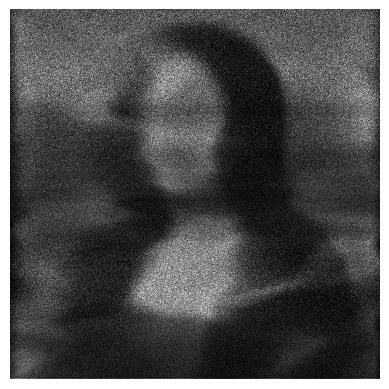

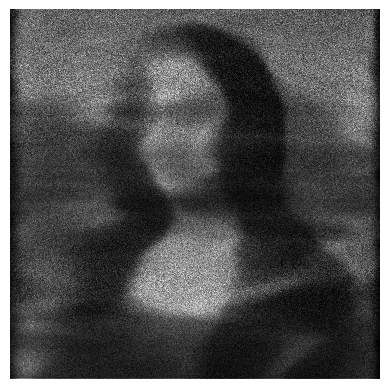

In [4]:
from crps_simple import CRPSRegressor as CRPSRegressorSimple
heads = 1
nens = 1
net = CRPSRegressorSimple(1, heads, nens).to(device)

for epoch in [19, 39, 99, 199, 499, 999, 1999]:
    net.load_state_dict(torch.load('results/crps_simple/%d.pt'%epoch, map_location=device))

    with torch.no_grad():
        to_plot_X = -((torch.arange(image_tensor.shape[0], device=device).float()/image_tensor.shape[0])*2-1).reshape(-1, 1)
        out_samp_unif_ = []
        out_samp_unif_weight_ = []
        for tpb in torch.tensor_split(to_plot_X, to_plot_X.shape[0]//10):
            samp = net(tpb, n_samples=10000//(heads*nens))
            out_samp_unif_.append(samp)
            #out_samp_unif_weight_.append(weight)
        t_sample = torch.concatenate(out_samp_unif_, dim=0)
        #t_weight = torch.concatenate(out_samp_unif_weight_, dim=0)
        t_sample = t_sample.view(t_sample.shape[0], -1)
        #t_weight = t_weight.view(t_weight.shape[0], -1)
        t_coord_sample = samples_to_coords(t_sample, norm=True)

        weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, t_sample.shape[1]).reshape(-1)
        full_weights = (weights/weights.max())

        plt.figure()
        plt.hist2d(*t_coord_sample.cpu().numpy(), weights=full_weights, bins=(np.linspace(-1.1, 1.1, int(image_tensor.shape[0]*1.2)), np.linspace(-1, 1, image_tensor.shape[1])), cmap='gray', rasterized=True);
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.gca().set_aspect(1)
        plt.axis("off")
        plt.savefig("plots/crps_simple_%d.pdf"%(epoch+1), bbox_inches='tight')
        plt.show()
        plt.close()

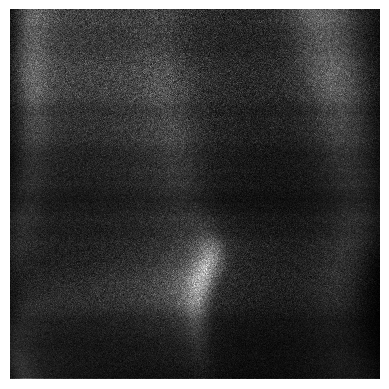

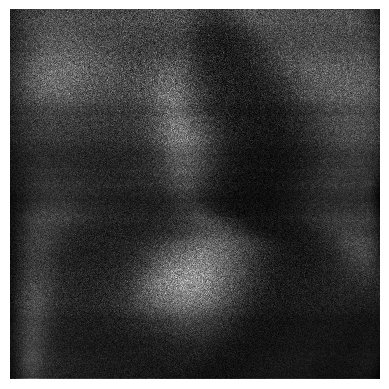

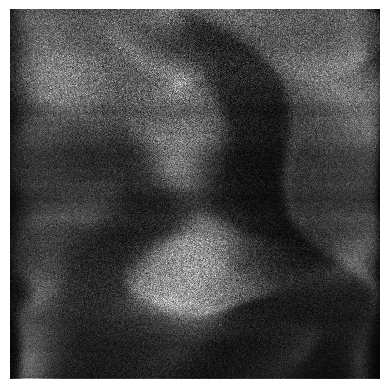

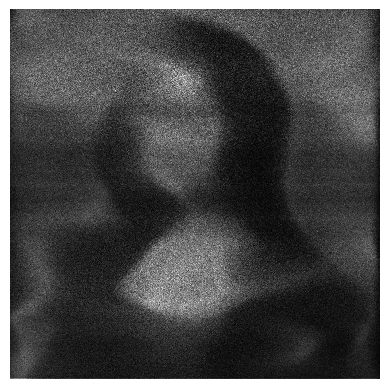

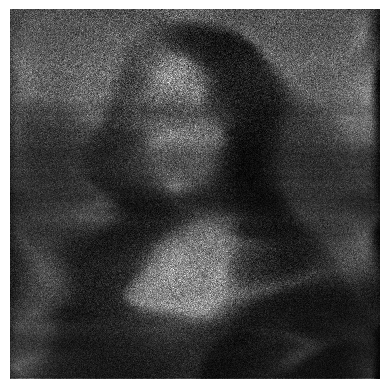

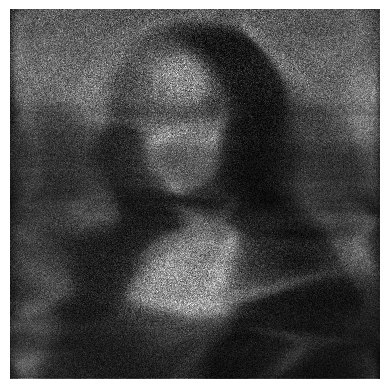

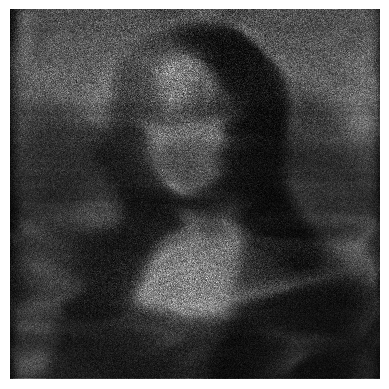

In [5]:
from crps_weighted import CRPSRegressor as CRPSRegressorWeighted
heads = 1
nens = 1
net = CRPSRegressorWeighted(1, heads, nens).to(device)

for epoch in [19, 39, 99, 199, 499, 999, 1999]:
    net.load_state_dict(torch.load('results/crps_weighted/%d.pt'%epoch, map_location=device))

    with torch.no_grad():
        to_plot_X = -((torch.arange(image_tensor.shape[0], device=device).float()/image_tensor.shape[0])*2-1).reshape(-1, 1)
        out_samp_unif_ = []
        out_samp_unif_weight_ = []
        for tpb in torch.tensor_split(to_plot_X, to_plot_X.shape[0]//10):
            samp, weight = net(tpb, n_samples=10000//(heads*nens))
            out_samp_unif_.append(samp)
            out_samp_unif_weight_.append(weight)
        t_sample = torch.concatenate(out_samp_unif_, dim=0)
        t_weight = torch.concatenate(out_samp_unif_weight_, dim=0)
        t_sample = t_sample.view(t_sample.shape[0], -1)
        t_weight = t_weight.view(t_weight.shape[0], -1)
        t_coord_sample = samples_to_coords(t_sample, norm=True)

        weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, t_sample.shape[1]).reshape(-1)
        full_weights = (weights/weights.max())*t_weight.reshape(-1).cpu()

        plt.figure()
        plt.hist2d(*t_coord_sample.cpu().numpy(), weights=full_weights, bins=(np.linspace(-1.1, 1.1, int(image_tensor.shape[0]*1.2)), np.linspace(-1, 1, image_tensor.shape[1])), cmap='gray', rasterized=True);
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.gca().set_aspect(1)
        plt.axis("off")
        plt.savefig("plots/crps_weighted_%d.pdf"%(epoch+1), bbox_inches='tight')
        plt.show()
        plt.close()

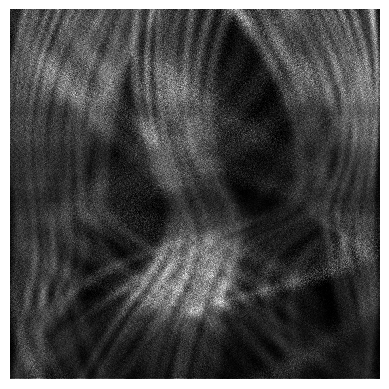

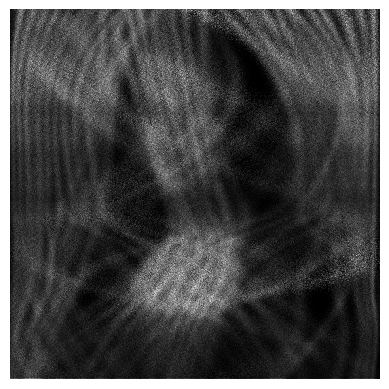

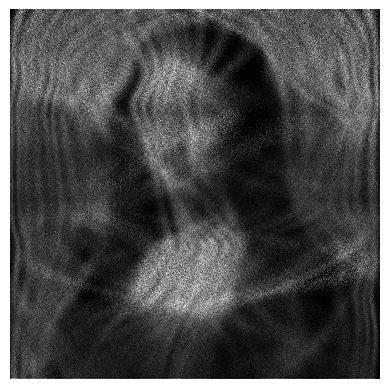

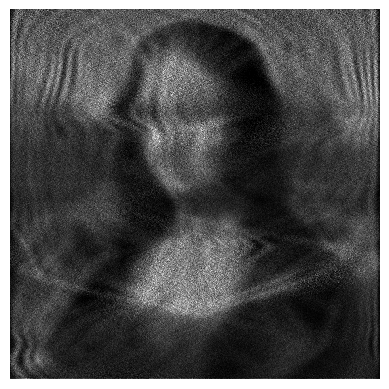

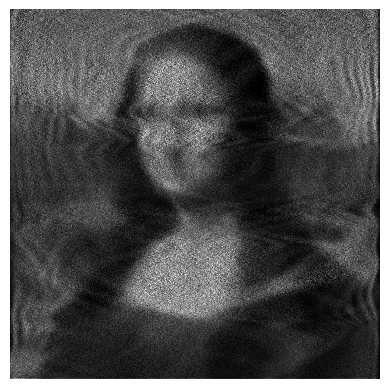

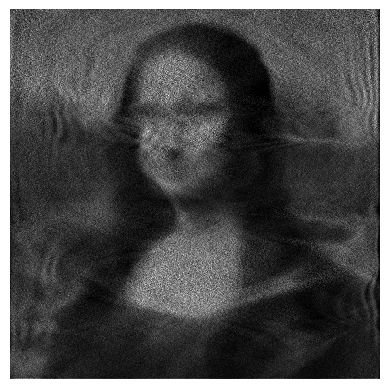

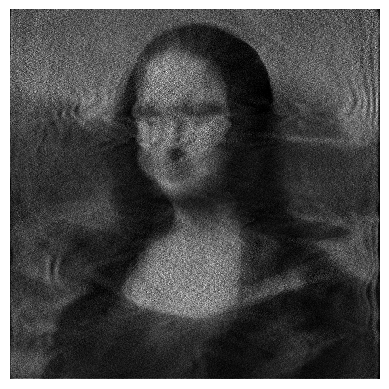

In [6]:
from crps_mh import CRPSRegressor as CRPSRegressorMH
heads = 50
nens = 1
net = CRPSRegressorMH(1, heads, nens).to(device)

for epoch in [19, 39, 99, 199, 499, 999, 1999]:
    net.load_state_dict(torch.load('results/crps_mh/%d.pt'%epoch, map_location=device))
    with torch.no_grad():
        to_plot_X = -((torch.arange(image_tensor.shape[0], device=device).float()/image_tensor.shape[0])*2-1).reshape(-1, 1)
        out_samp_unif_ = []
        out_samp_unif_weight_ = []
        for tpb in torch.tensor_split(to_plot_X, to_plot_X.shape[0]//10):
            samp, weight = net(tpb, n_samples=10000//(heads*nens))
            out_samp_unif_.append(samp)
            out_samp_unif_weight_.append(weight)
        t_sample = torch.concatenate(out_samp_unif_, dim=0)
        t_weight = torch.concatenate(out_samp_unif_weight_, dim=0)
        t_sample = t_sample.view(t_sample.shape[0], -1)
        t_weight = t_weight.view(t_weight.shape[0], -1)
        t_coord_sample = samples_to_coords(t_sample, norm=True)

        weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, t_sample.shape[1]).reshape(-1)
        full_weights = (weights/weights.max())*t_weight.reshape(-1).cpu()

        plt.figure()
        plt.hist2d(*t_coord_sample.cpu().numpy(), weights=full_weights, bins=(np.linspace(-1.1, 1.1, int(image_tensor.shape[0]*1.2)), np.linspace(-1, 1, image_tensor.shape[1])), cmap='gray', rasterized=True);
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.gca().set_aspect(1)
        plt.axis("off")
        plt.savefig("plots/crps_mh_%d.pdf"%(epoch+1), bbox_inches='tight')
        plt.show()
        plt.close()

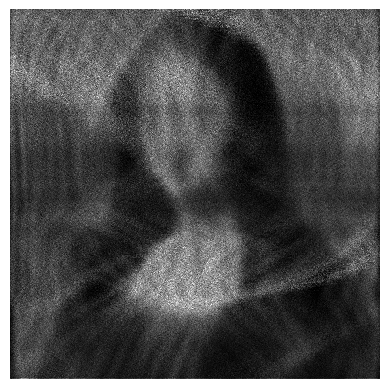

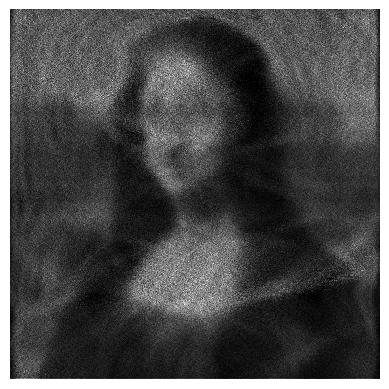

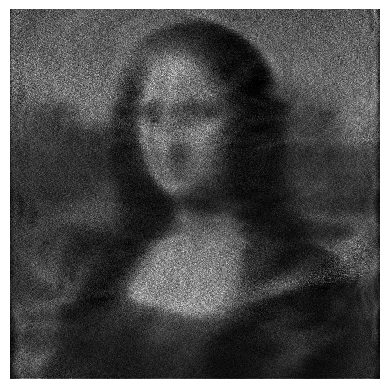

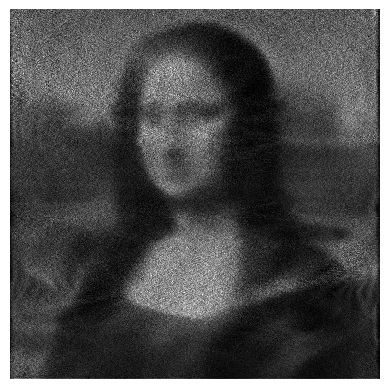

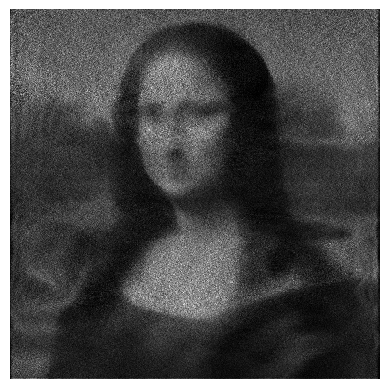

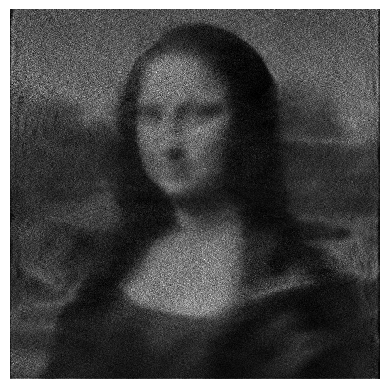

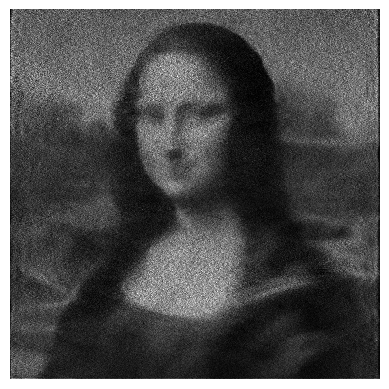

In [7]:
from crps_lmh import CRPSRegressor as CRPSRegressorLMH
heads = 50
nens = 5
net = CRPSRegressorMH(1, heads, nens).to(device)

for epoch in [19, 39, 99, 199, 499, 999, 1999]:
    net.load_state_dict(torch.load('results/crps_lmh/%d.pt'%epoch, map_location=device))
    with torch.no_grad():
        to_plot_X = -((torch.arange(image_tensor.shape[0], device=device).float()/image_tensor.shape[0])*2-1).reshape(-1, 1)
        out_samp_unif_ = []
        out_samp_unif_weight_ = []
        for tpb in torch.tensor_split(to_plot_X, to_plot_X.shape[0]//10):
            samp, weight = net(tpb, n_samples=10000//(heads*nens))
            out_samp_unif_.append(samp)
            out_samp_unif_weight_.append(weight)
        t_sample = torch.concatenate(out_samp_unif_, dim=0)
        t_weight = torch.concatenate(out_samp_unif_weight_, dim=0)
        t_sample = t_sample.view(t_sample.shape[0], -1)
        t_weight = t_weight.view(t_weight.shape[0], -1)
        t_coord_sample = samples_to_coords(t_sample, norm=True)

        weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, t_sample.shape[1]).reshape(-1)
        full_weights = (weights/weights.max())*t_weight.reshape(-1).cpu()

        plt.figure()
        plt.hist2d(*t_coord_sample.cpu().numpy(), weights=full_weights, bins=(np.linspace(-1.1, 1.1, int(image_tensor.shape[0]*1.2)), np.linspace(-1, 1, image_tensor.shape[1])), cmap='gray', rasterized=True);
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.gca().set_aspect(1)
        plt.axis("off")
        plt.savefig("plots/crps_lmh_%d.pdf"%(epoch+1), bbox_inches='tight')
        plt.show()
        plt.close()

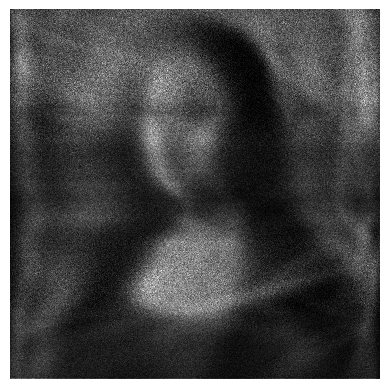

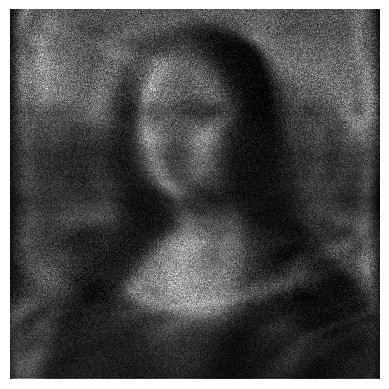

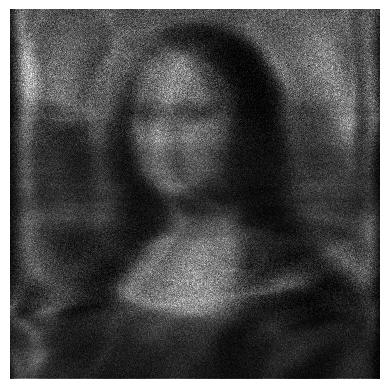

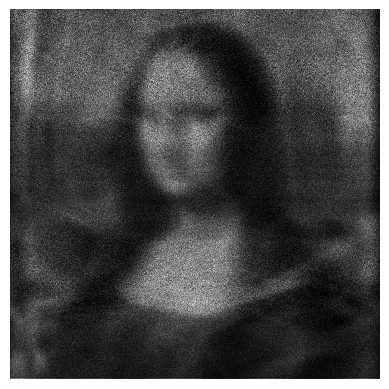

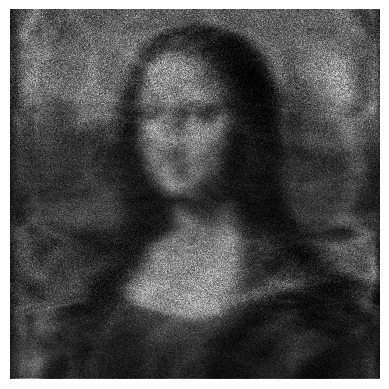

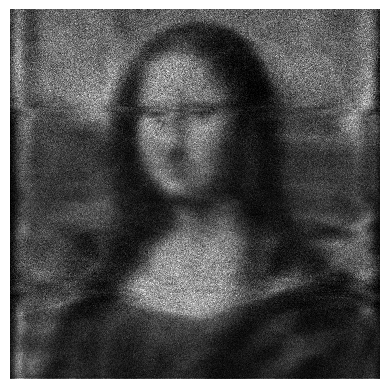

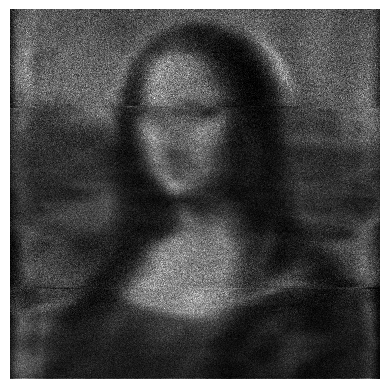

In [8]:
from mdn import MDN as MDN
n_components = 100
net = MDN(1, n_components).to(device)

for epoch in [19, 39, 99, 199, 499, 999, 1999]:
    net.load_state_dict(torch.load('results/mdn/%d.pt'%epoch, map_location=device))
    with torch.no_grad():
        to_plot_X = -((torch.arange(image_tensor.shape[0], device=device).float()/image_tensor.shape[0])*2-1).reshape(-1, 1)

        out_samp_unif_ = []
        out_samp_unif_weight_ = []
        for tpb in torch.tensor_split(to_plot_X, to_plot_X.shape[0]//10):
            samp = net.sample(net(tpb), 10000)
            out_samp_unif_.append(samp)
        t_sample = torch.concatenate(out_samp_unif_, dim=0)
        t_sample = t_sample.view(t_sample.shape[0], -1)
        t_coord_sample = samples_to_coords(t_sample, norm=True)

        weights = image_tensor.sum(dim=1).unsqueeze(1).expand(-1, t_sample.shape[1]).reshape(-1)
        full_weights = (weights/weights.max())

        plt.figure()
        plt.hist2d(*t_coord_sample.cpu().numpy(), weights=full_weights, bins=(np.linspace(-1.1, 1.1, int(image_tensor.shape[0]*1.2)), np.linspace(-1, 1, image_tensor.shape[1])), cmap='gray', rasterized=True);
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.gca().set_aspect(1)
        plt.axis("off")
        plt.savefig("plots/mdn_%d.pdf"%(epoch+1), bbox_inches='tight')
        plt.show()
        plt.close()